In [1]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.3/949.3 kB 23.2 MB/s eta 0:00:0000:01
Note: you may need to restart the kernel to use updated packages.


In [2]:
from ultralytics import YOLO
import yaml
import torch
from PIL import Image
from IPython.display import display

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
train = "/kaggle/input/license-plate-dataset/archive/images/train"
val = "/kaggle/input/license-plate-dataset/archive/images/val"

In [4]:
data_yaml_content = {
    'train': train,
    'val': val,
    'nc': 1,
    'names': {0: 'license_plate'}
}

yaml_path = "/kaggle/working/data.yaml"


with open(yaml_path, "w") as f:
    yaml.dump(data_yaml_content, f, default_flow_style=False)

In [5]:
model = YOLO("yolov8s.pt")

results = model.train(data="/kaggle/working/data.yaml",
                      epochs=40,
                        batch=32,
                          imgsz=640,
                      device=0,
                        workers=2,
                          project='mikhone',
                            mosaic=True,
                              weight_decay=0.0005,
                      hsv_h=0.015,
                        hsv_s=0.7,
                          hsv_v=0.4,
                              save_period=20,
                      optimizer="SGD")


100%|██████████| 21.5M/21.5M [00:00<00:00, 350MB/s]


Ultralytics 8.3.93 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/working/data.yaml, epochs=40, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=20, cache=False, device=0, workers=2, project=mikhone, name=train, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, 

100%|██████████| 755k/755k [00:00<00:00, 45.4MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 84.1MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/input/license-plate-dataset/archive/labels/train... 1525 images, 0 backgrounds, 1 corrupt: 100%|██████████| 1526/1526 [00:11<00:00, 138.54it/s]

train: WARNING ⚠️ /kaggle/input/license-plate-dataset/archive/images/train/car-wbs-MH03AR5549_00000.jpg: ignoring corrupt image/label: [Errno 30] Read-only file system: '/kaggle/input/license-plate-dataset/archive/images/train/car-wbs-MH03AR5549_00000.jpg'


train: WARNING ⚠️ Cache directory /kaggle/input/license-plate-dataset/archive/labels is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/input/license-plate-dataset/archive/labels/val... 169 images, 0 backgrounds, 0 corrupt: 100%|██████████| 169/169 [00:01<00:00, 121.97it/s]

val: WARNING ⚠️ Cache directory /kaggle/input/license-plate-dataset/archive/labels is not writeable, cache not saved.


Plotting labels to mikhone/train/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to mikhone/train
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40       7.8G       1.12      2.858      1.141         43        640: 100%|██████████| 48/48 [00:26<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.22it/s]

                   all        169        169      0.976       0.97      0.989      0.827



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      7.81G     0.8162     0.6468     0.9349         40        640: 100%|██████████| 48/48 [00:25<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        169        169      0.951       0.97      0.984      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      7.81G     0.8632     0.7007     0.9481         36        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]

                   all        169        169      0.936      0.834      0.947      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      7.81G     0.8993     0.6616     0.9674         37        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.35it/s]

                   all        169        169      0.969      0.938      0.971      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      7.81G     0.8876      0.637      0.975         40        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        169        169      0.951      0.953      0.982      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      7.81G     0.8483     0.6086     0.9569         38        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.56it/s]

                   all        169        169       0.93      0.946      0.986      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      7.81G     0.8408     0.5798     0.9589         44        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.70it/s]

                   all        169        169      0.928      0.844      0.919      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      7.81G     0.8199     0.5561     0.9561         45        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.67it/s]

                   all        169        169       0.98      0.976      0.992      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40      7.81G      0.796     0.5359     0.9428         39        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        169        169      0.951      0.953      0.987      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      7.81G     0.7872     0.5303     0.9343         35        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        169        169      0.972      0.976      0.991      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      7.81G     0.7728     0.5096     0.9336         37        640: 100%|██████████| 48/48 [00:25<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all        169        169      0.979      0.982       0.99      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      7.81G     0.7468     0.5033     0.9256         36        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all        169        169      0.953       0.97      0.992      0.825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40      7.81G     0.7588     0.4868     0.9275         39        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]

                   all        169        169      0.982       0.97       0.99      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      7.81G     0.7352     0.4799     0.9214         46        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.62it/s]

                   all        169        169      0.991      0.988      0.989       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      7.81G     0.7231     0.4729     0.9182         41        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all        169        169      0.994      0.988      0.988      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      7.81G     0.7169     0.4689     0.9215         38        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.52it/s]

                   all        169        169      0.988      0.988      0.992      0.817



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      7.81G     0.7236     0.4549     0.9198         37        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.66it/s]

                   all        169        169      0.994      0.987      0.995      0.842



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      7.81G     0.6999     0.4373     0.9085         35        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all        169        169      0.994      0.974      0.994      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      7.81G     0.7061      0.448     0.9064         40        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.64it/s]

                   all        169        169      0.988      0.994      0.994      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      7.81G     0.6675     0.4241     0.9024         34        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.60it/s]

                   all        169        169      0.988      0.997      0.994      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40      7.81G     0.6823     0.4253      0.907         32        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.72it/s]

                   all        169        169      0.992      0.994      0.995      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      7.81G     0.6607     0.4108     0.8918         37        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.74it/s]

                   all        169        169      0.994      0.994      0.994      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      7.81G     0.6537     0.4061     0.8923         37        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.58it/s]

                   all        169        169      0.983      0.999      0.994      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      7.81G     0.6616     0.4089     0.8927         46        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.67it/s]

                   all        169        169      0.993      0.994      0.994      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40      7.81G     0.6357     0.3972     0.8865         43        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.59it/s]

                   all        169        169      0.991      0.994      0.995      0.867



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      7.81G       0.62     0.3794     0.8819         51        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all        169        169      0.994      0.993      0.994      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      7.81G     0.6244     0.3792      0.875         36        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.63it/s]

                   all        169        169      0.981      0.994      0.993      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      7.81G      0.629     0.3725     0.8762         51        640: 100%|██████████| 48/48 [00:25<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.72it/s]

                   all        169        169      0.991      0.994      0.993      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      7.81G     0.5953     0.3608     0.8731         38        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.48it/s]

                   all        169        169      0.993      0.994      0.994      0.866



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      7.81G     0.6118     0.3722     0.8719         31        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.65it/s]

                   all        169        169      0.994      0.994      0.994      0.867


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      7.81G     0.5611     0.3329      0.844         21        640: 100%|██████████| 48/48 [00:26<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.57it/s]

                   all        169        169      0.988      0.987      0.993      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40      7.81G     0.5629      0.332     0.8471         21        640: 100%|██████████| 48/48 [00:25<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.72it/s]

                   all        169        169      0.994      0.981      0.989       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40      7.81G     0.5434     0.3165     0.8425         21        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.76it/s]

                   all        169        169      0.993      0.994      0.992      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      7.81G      0.546     0.3187     0.8382         21        640: 100%|██████████| 48/48 [00:25<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.71it/s]

                   all        169        169      0.993      0.988      0.993      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      7.81G     0.5307     0.3055     0.8354         21        640: 100%|██████████| 48/48 [00:25<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.55it/s]

                   all        169        169      0.988      0.994      0.993      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      7.81G     0.5197     0.2977     0.8326         21        640: 100%|██████████| 48/48 [00:25<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.54it/s]

                   all        169        169      0.993      0.994      0.994      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40      7.81G     0.5097     0.2877     0.8331         20        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.73it/s]

                   all        169        169      0.994      0.994      0.993      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      7.81G     0.5049     0.2872     0.8267         20        640: 100%|██████████| 48/48 [00:25<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.75it/s]

                   all        169        169      0.993      0.994      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      7.81G     0.4906     0.2756     0.8284         20        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.77it/s]

                   all        169        169      0.994      0.994      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      7.81G     0.4782     0.2633     0.8212         21        640: 100%|██████████| 48/48 [00:25<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.68it/s]

                   all        169        169      0.994      0.994      0.994      0.891



40 epochs completed in 0.301 hours.
Optimizer stripped from mikhone/train/weights/last.pt, 22.5MB
Optimizer stripped from mikhone/train/weights/best.pt, 22.5MB

Validating mikhone/train/weights/best.pt...
Ultralytics 8.3.93 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  1.60it/s]


                   all        169        169      0.994      0.994      0.994       0.89


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 4.7ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to mikhone/train


In [6]:
import os
import seaborn as sns
import matplotlib.pyplot as plt
import glob
import cv2
import random
import pandas as pd

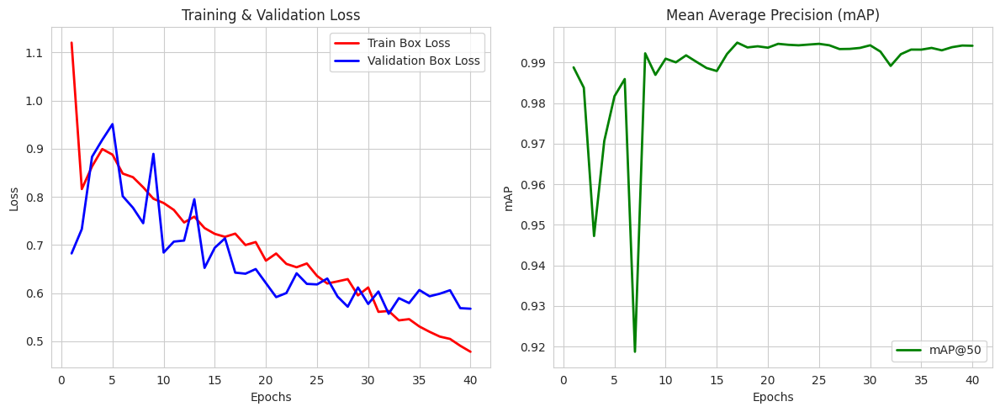

In [9]:
df = pd.read_csv('/kaggle/working/mikhone/train/results.csv')  


map_column = "metrics/mAP50(B)" 
loss_column_train = "train/box_loss"
loss_column_val = "val/box_loss"

plt.figure(figsize=(12, 5))

sns.set_style("whitegrid")

plt.subplot(1, 2, 1)
plt.plot(df["epoch"], df[loss_column_train], label="Train Box Loss", color="red", linewidth=2)
plt.plot(df["epoch"], df[loss_column_val], label="Validation Box Loss", color="blue", linewidth=2)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training & Validation Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(df["epoch"], df[map_column], label="mAP@50", color="green", linewidth=2)
plt.xlabel("Epochs")
plt.ylabel("mAP")
plt.title("Mean Average Precision (mAP)")
plt.legend()

plt.tight_layout()

plt.show()

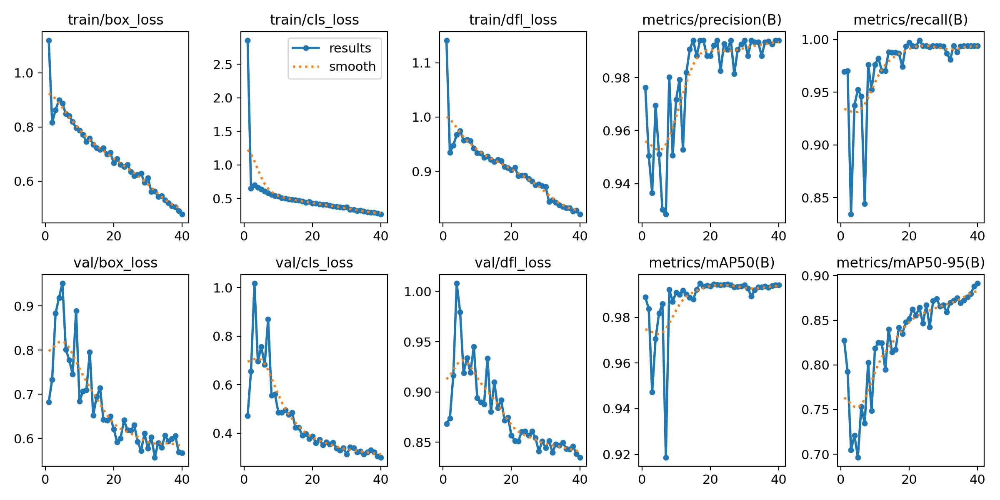

In [ ]:
train_results = "/kaggle/working/mikhone/train/results.png"

if os.path.exists(train_results):
    img = Image.open(train_results) 
    display(img)  
else:
    print("Training results image not found.")


image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video8_1550.jpg: 448x640 1 license_plate, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video8_1520.jpg: 384x640 1 license_plate, 38.8ms
Speed: 2.0ms preprocess, 38.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video8_130.jpg: 640x640 1 license_plate, 9.3ms
Speed: 2.5ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video4_3860.jpg: 512x640 1 license_plate, 8.1ms
Speed: 2.0ms preprocess, 8.1ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 /kaggle/input/license-plate-dataset/archive/images/val/video9_260.jpg: 384x640 1 license_plate, 8.6ms
Speed: 1.9ms preprocess, 8.6ms inference, 1.1m

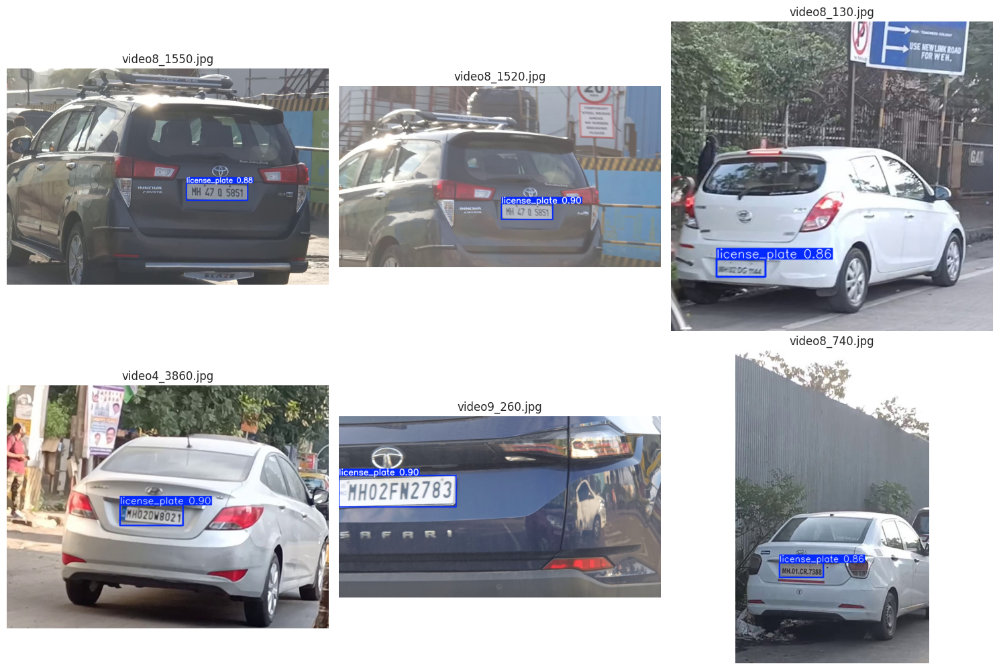

In [19]:
all_images = glob.glob("/kaggle/input/license-plate-dataset/archive/images/val/*.jpg")
test_images = random.sample(all_images, 6)


fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)      
    result_img = results[0].plot() 
    
    
    img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)
    ax.axis("off")
    ax.set_title(os.path.basename(img_path))  
plt.tight_layout()
plt.show()

In [ ]:
image_directory = "/kaggle/input/license-plate-dataset/archive/images/val/"

all_images = glob.glob(os.path.join(image_directory, "*.jpg"))

test_images = random.sample(all_images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)
    
    annotated_image = results[0].plot()
    
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    
    ax.imshow(annotated_image_rgb)
    ax.axis("off")  
    ax.set_title(os.path.basename(img_path)) 


plt.tight_layout()

plt.show()


image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/57e92915-935a-4a91-91f8-f3ad70040a6e___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_847071203_1_1080x720_nissan-terrano-xv-d-thp-premium-110-ps-2015-diesel-ghaziabad.jpg: 640x480 1 license_plate, 41.0ms
Speed: 2.3ms preprocess, 41.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/5231116f-7a07-4ce2-b437-d34b497e7969___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_844329566_3_1080x720_nissan-terrano-xe-d-2014-diesel-.jpg: 640x480 1 license_plate, 6.8ms
Speed: 2.1ms preprocess, 6.8ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/2c9306ab-3454-4ca0-89fd-db3f51dabcef___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Nissan-Terrano-front-three-quarters-on-plain-ground.jpg: 448x640 1 license_plate, 39.2ms
Speed: 1.9ms preprocess, 39.2ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640

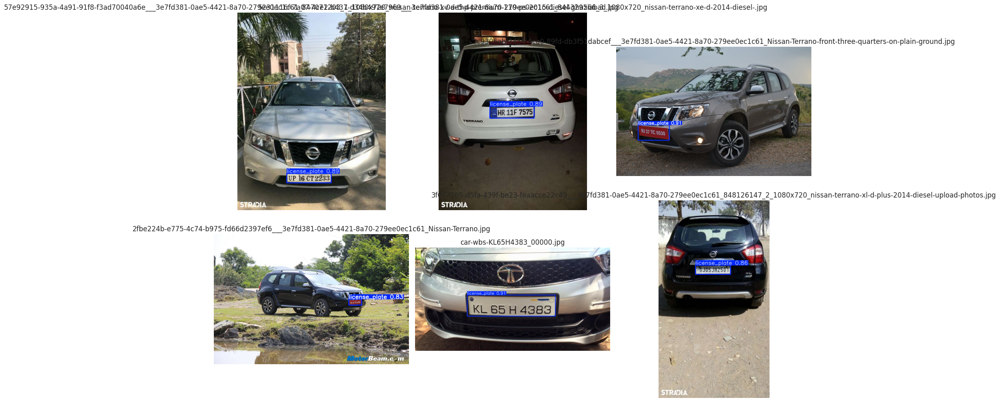

In [11]:
all_images = glob.glob("/kaggle/input/indian-vehicle-dataset/google_images/*.jpg")



test_images = random.sample(all_images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)
    
    annotated_image = results[0].plot()
    
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    
    ax.imshow(annotated_image_rgb)
    ax.axis("off")  
    ax.set_title(os.path.basename(img_path))  

plt.tight_layout()


plt.show()

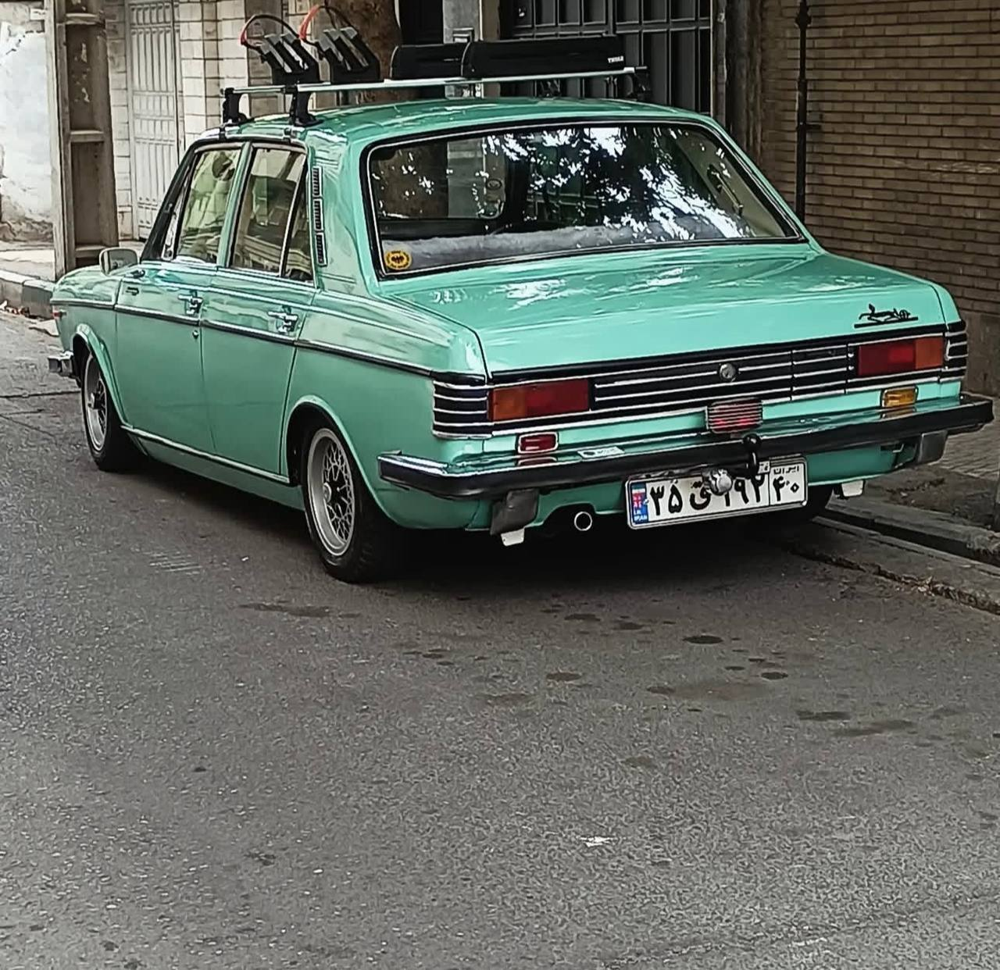

In [12]:
c1=Image.open('/kaggle/input/plate-man/plate/photo_2025-03-18_03-04-48.jpg')
display(c1)


image 1/1 /kaggle/input/plate-man/plate/photo_2025-03-18_03-04-48.jpg: 640x640 1 license_plate, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


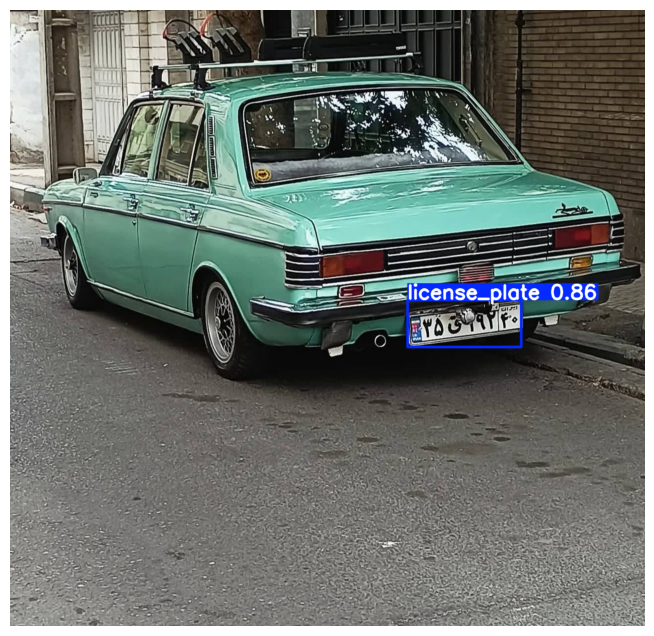

In [15]:
model_path = "/kaggle/working/mikhone/train/weights/best.pt"

model = YOLO(model_path)

image_path = "/kaggle/input/plate-man/plate/photo_2025-03-18_03-04-48.jpg"
results = model(image_path)

annotated_image = results[0].plot()

annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 8))
plt.imshow(annotated_image_rgb)
plt.axis("off")
plt.show()


image 1/1 /kaggle/input/plate-man/plate/photo_2025-03-18_03-45-56.jpg: 640x640 1 license_plate, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/plate-man/plate/photo_2025-03-18_03-45-46.jpg: 640x640 1 license_plate, 8.5ms
Speed: 3.0ms preprocess, 8.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/plate-man/plate/photo_2025-03-18_03-04-48.jpg: 640x640 1 license_plate, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/plate-man/plate/photo_2025-03-18_03-45-59.jpg: 480x640 1 license_plate, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/input/plate-man/plate/photo_2025-03-18_03-05-13.jpg: 640x544 4 license_plates, 8.3ms
Speed: 2.7ms preprocess, 8.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 544)

ima

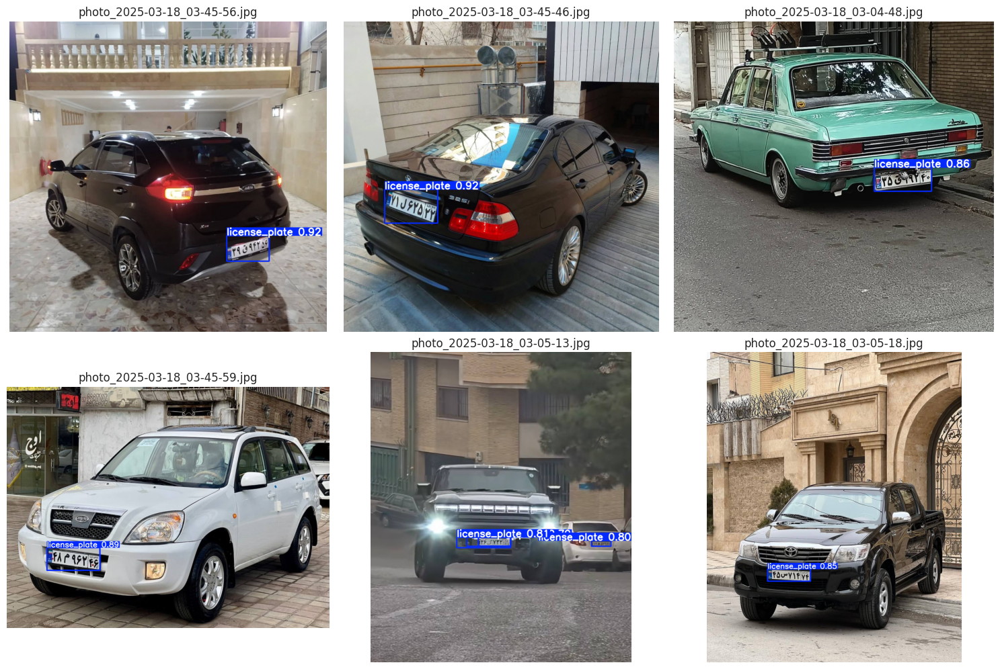

In [18]:

model = YOLO('/kaggle/working/mikhone/train/weights/best.pt') 

test_images = glob.glob('/kaggle/input/plate-man/plate/*.jpg')

selected_images = random.sample(test_images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(selected_images, axes.flatten()):
    results = model(img_path)
    
    annotated_image = results[0].plot()
    

    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    

    ax.imshow(annotated_image_rgb)
    ax.axis("off")
    ax.set_title(os.path.basename(img_path))

plt.tight_layout()


plt.show()


image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/10c96324-3452-43e2-aa68-c8ae7d3c1b6e___844874771_1_1080x720_maruti-suzuki-wagon-r-vxi-bs-iii-2014-petrol-.jpg.jpeg: 608x640 1 license_plate, 38.1ms
Speed: 2.4ms preprocess, 38.1ms inference, 1.2ms postprocess per image at shape (1, 3, 608, 640)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/fcabfaf7-160a-44bc-a543-9faee4c1c4cd___Honda-Jazz-Front-Number-Plates-Designs.jpg.jpeg: 480x640 1 license_plate, 39.2ms
Speed: 2.0ms preprocess, 39.2ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/car-wbs-KL10AW2111_00000.jpeg: 576x640 1 license_plate, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.2ms postprocess per image at shape (1, 3, 576, 640)

image 1/1 /kaggle/input/indian-vehicle-dataset/google_images/bb210ab4-795c-4b2b-9b6e-4597cbc67375___White-2BPlate.jpeg: 512x640 1 license_plate, 38.2ms
Speed: 1.8ms preprocess, 38.2ms inference

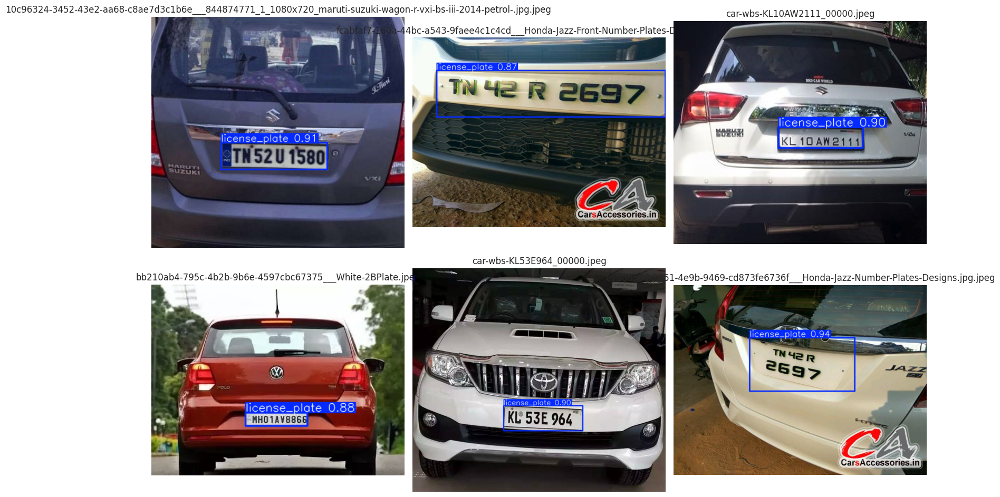

In [17]:
model_path = "/kaggle/working/mikhone/train/weights/best.pt"

model = YOLO(model_path)

image_directory = "/kaggle/input/indian-vehicle-dataset/google_images"  

all_images = glob.glob(image_directory + "/*.[jJ][pP][eE][gG]")

test_images = random.sample(all_images, 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for img_path, ax in zip(test_images, axes.flatten()):
    results = model(img_path)
    
    annotated_image = results[0].plot()
    
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    
    ax.imshow(annotated_image_rgb)
    ax.axis("off")  
    ax.set_title(os.path.basename(img_path)) 


plt.tight_layout()

plt.show()